# Métricas de Avaliação 

Avaliar seu algoritmo the Machine Learning (ML) é parte essencial de qualquer projeto. 
Existem diversas métricas para avaliar as mais diferences applicações de ML. Para algumas aplicações uma única métrica pode ser o suficente para julgar um modelo, para outras aplicações uma métrica apenas pode não dar ser suficiente para avaliar concretamente seu modelo. 

Nesta aula vamos ver algumas métricas dos algoritmos de classificação.

    - Matriz de confusão
    - Acurácia
    - Precisão
    - Recall
    - F1-Score



## Matriz de confusão

Uma matriz de confusão é uma tabela que indica os erros e acertos do seu modelo, comparando com o resultado esperado (ou etiquetas/labels). A imagem abaixo demonstra um exemplo de uma matriz de confusão.

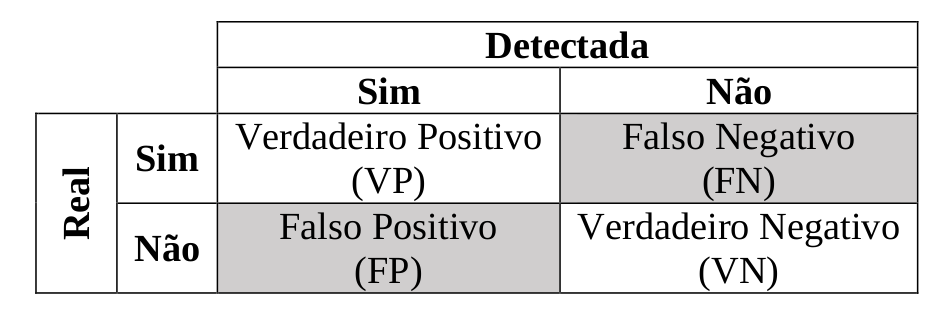!

- Verdadeiros Positivos: classificação correta da classe Positivo;
- Falsos Positivos (Erro Tipo I): erro em que o modelo previu a classe Positivo quando o valor real era classe Negativo;
- Falsos Negativos (Erro Tipo II): erro em que o modelo previu a classe Negativo quando o valor real era classe Positivo;
- Verdadeiros Negativos: classificação correta da classe Negativo.


A matriz de confusão oferece uma visão tabular das predições do modelo vs os valores reais esperados. 

### Exemplo
Digamos que estamos construindo um classificador binário que classifica veiculos militares entre os veículos civis. O nosso cliente nos entregou uma base com 2000 imagens que contém veículos militares e cívis e para cada imagem o nosso cliente nos forneceu o rótulo dizendo se é militar o civil. Os rótulos são 0 se o veículo é militar e 1 se o veículo é civil.

Exemplo: 
<div>
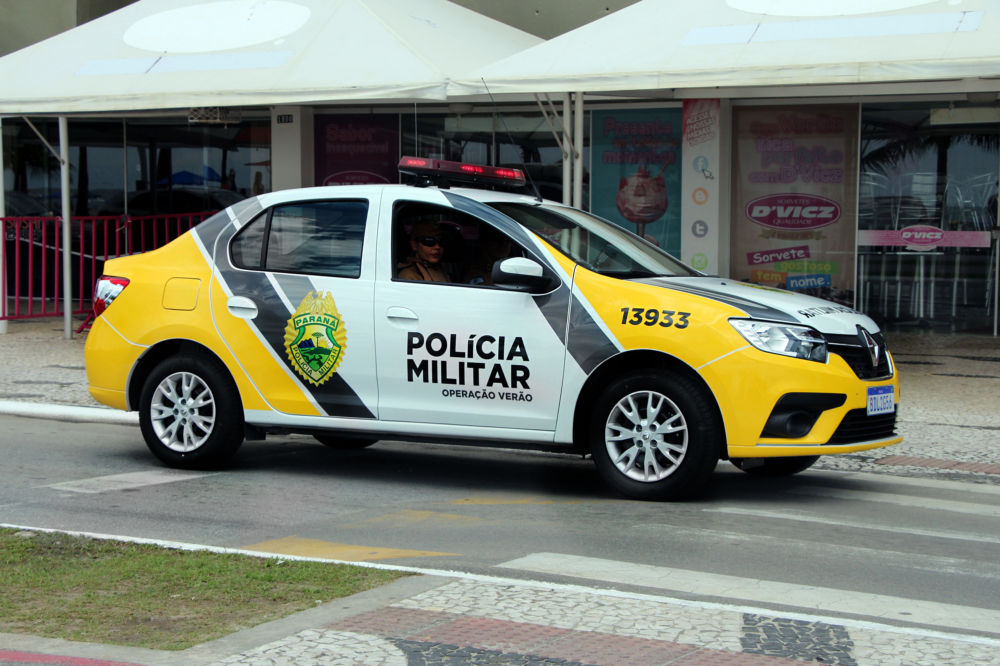
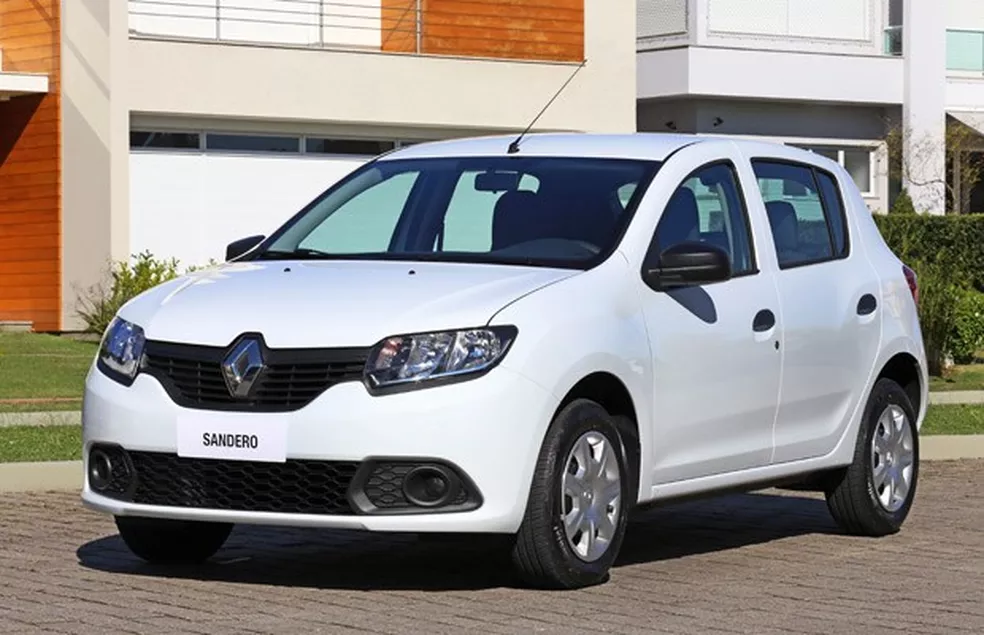
</div>

#### Vamos agora treinar um classificador para esse problema

In [341]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import pandas as pd
import numpy as np

In [342]:
# A função make_classification gera uma base de dados com base em informações que passamos. 
X, y = make_classification(n_samples=2000, n_features=10, n_classes=2, random_state=0, weights=(.35, ), n_informative=6)

In [345]:
base = pd.DataFrame(X, columns=[f"Feature_{i}" for i in range(10)]).join(pd.DataFrame(y, columns=["Rótulo"]))
base.head()

,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Rótulo
0,-0.040513,2.951265,1.060261,-2.652453,-0.957480,-0.274823,1.503258,1.608859,-2.110294,-3.656248,1
1,0.975773,-0.454778,-1.022146,-0.661446,-1.124285,3.005591,-1.010734,3.773225,-3.272214,-2.707370,0
2,1.573295,0.396197,1.226483,0.448688,-1.340132,1.479806,0.900919,-1.357744,-0.279952,0.724771,1
3,0.819620,0.196415,-1.459497,-0.118134,0.700670,-0.535779,0.245606,-0.429413,0.134366,0.540658,0
4,1.798295,0.931386,-1.846217,0.726682,1.353039,1.481476,-1.074663,-0.857414,-0.920220,-0.356325,1


In [346]:
# dividir a base de trainamento e base de testes
X_train, X_test, y_train, y_test = train_test_split(base[base.columns[:-1]], base["Rótulo"], random_state=0, test_size=600, )
X_train.shape, X_test.shape

((1400, 10), (600, 10))

In [348]:
# Treinar um classificador Support Vector Machines
clf = SVC(random_state=0)
clf.fit(X_train, y_train)

SVC(random_state=0)

In [349]:
predictions = clf.predict(X_test)

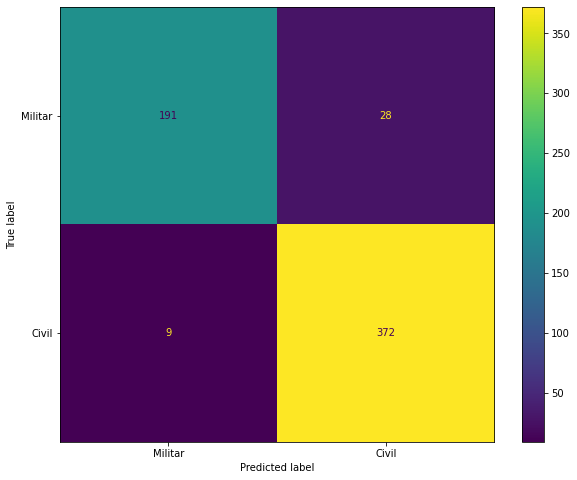

In [386]:
fig, ax = plt.subplots(figsize = (10,8))
cm = confusion_matrix(y_test, predictions,)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Militar", "Civil"], )
disp.plot(ax=ax);

- O que a Matriz de Confusão acima nos indica?
- Quais são os erros Tipo I e Tipo II?


### Derivando as métricas a partir da matriz de confusão


A partir desta matriz de confusão conseguimos derivar as principais métricas para avaliar nosso modelo. Veja esse esquema abaixo:


<div>
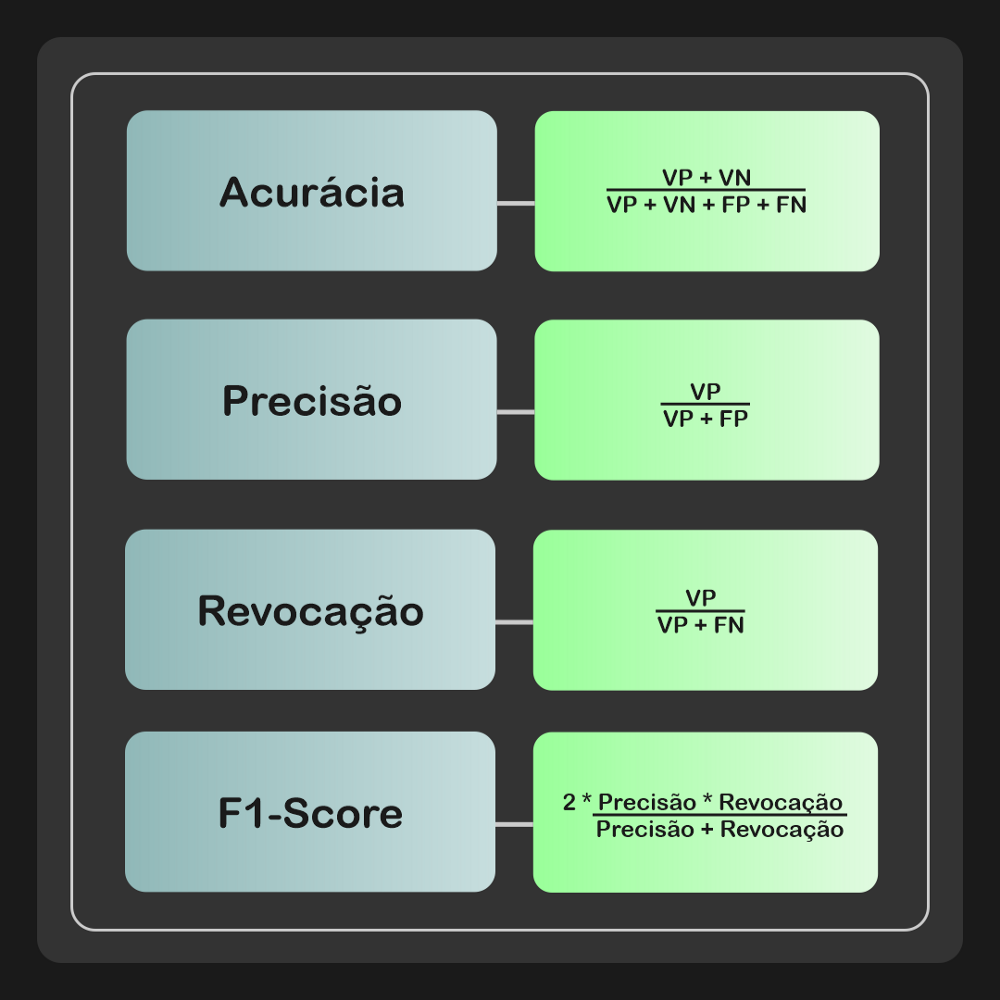
</div>


- VP = Verdadeiro Positivo
- VN = Verdadeiro Negativo
- FP = Falso Positivo
- FN = False Negativo

## Acurácia
Indica uma performance geral do modelo. Ou seja, dentre todas as predições, quantas o modelo classificou corretamente.

- A formula da acurácia é (VP+VN) / VP+VN+FP+FN


A palavra acuracidade surgiu a partir da palavra inglesa accuracy, que significa exatidão e rigor.  O termo é definido como exatidão de um valor obtido com relação a um valor tomado como referência. Modelos acurados são aqules cujo a predicão se aproxima do valor correto, ou seja, valor de referência.

In [388]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions, )

0.9383333333333334

Acabamos de calcular a acurácia do modelo através da função accuracy_score. Agora vamos validar essa métrica utilizando a fórmula da acurácia e a matriz de confusão.

## Precisão
Indica dentre todas as classificações de classe Positivo que o modelo fez, quantas estão corretas;

- A formula da precisão é VP / VP+FP


A precisão é utilizada para medir a performance para cada classe. Muito útil para quando estamos lidando com classes desbalanceadas. 


Olhando esta fórmula, podemos ver que a precisão dá um ênfase maior para os erros por falso positivo. Podemos entender a precisão como sendo a expressão matemática para a pergunta: dos exemplos classificados como positivos, quantos realmente são positivos? 

In [389]:
from sklearn.metrics import precision_score
precision_score(y_test, predictions, pos_label=0)

0.955

In [390]:
precision_score(y_test, predictions, pos_label=1)

0.93

De maneira similar, vamos verificar através da matriz de confusão se os cálculos da acurácia para as classes 0 e 1 (militar oe civil) estão corretos.

## Recall/Revocação/Sensibilidade
Indica dentre todas dentre todas as situações de classe Positivo como valor esperado, quantas estão corretas;


- A formula da precisão é VP / VP+FN


A revocação busca responder a seguinte pergunta: de todos os exemplos que são positivos, quantos foram classificados corretamente como positivos?



In [391]:
from sklearn.metrics import recall_score

In [392]:
recall_score(y_test, predictions, pos_label=0)

0.8721461187214612

Calcule o recall com base na matriz de confusão

## F1-Score

É a métrica que leva em consideração tanto a precisão quanto o recall. Ela é definida pela média harmônica entre as duas, como pode ser visto abaixo. 

- A formula da precisão é F1 = 2 * ((precisão * recall) / (precisao + recall))

É uma maneira de visualizar as Métricas de Precisão e Recall em apenas uma métrica. 


In [393]:
from sklearn.metrics import f1_score

In [394]:
f1_score(predictions, y_test, pos_label=0)

0.9116945107398569

### Exemplo onde a acurácia não avalia bem o modelo


Uma das maiores desvantagens é que em alguns problemas a acurácia pode ser elevada mas, ainda assim, o modelo pode ter uma performance inadequada. Por exemplo, considere o modelo que classifica exames de câncer entre positivo ou negativo para a doença, e em nosso conjunto de dados temos 1000 exemplos, sendo 990 de pacientes sem câncer e 10 de pacientes com câncer. Caso nosso modelo seja ingênuo e sempre classifique todos os exemplos com negativo (sem câncer), ele ainda obteria uma acurácia de 99%. O que parece uma excelente métrica, mas na verdade não estamos avaliando nosso modelo de forma adequada. Para melhor avaliar modelos que lidam com conjuntos de dados desbalanceados como este, outras métricas que serão apresentadas em seguida devem ser utilizadas.

In [318]:
X, y = make_classification(n_samples=10000, n_features=50, n_classes=2, random_state=0, weights=(.05, .95))

In [319]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=1000, )

In [320]:
sum(y_test == 1), sum(y_test == 0)

(942, 58)

In [321]:
# Treinar um classificador Support Vector Machines
clf = SVC(random_state=0)
clf.fit(X_train, y_train)

SVC(random_state=0)

In [322]:
predictions = clf.predict(X_test)

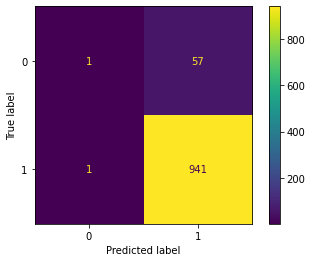

In [323]:
cm = confusion_matrix(y_test, predictions, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

In [331]:
accuracy_score(predictions, y_test)

0.942

In [340]:
precision_score(predictions, y_test, pos_label=0)

0.017241379310344827

In [339]:
recall_score(predictions, y_test, pos_label=0)

0.5

In [338]:
f1_score(predictions, y_test, pos_label=0)

0.03333333333333333